In [65]:
import os
from pathlib import Path
# import shutil
from functools import partial
import glob
import gc
from time import perf_counter
from collections import OrderedDict
import warnings
from typing import Literal

from IPython.display import display, clear_output
import uuid
import ipywidgets as widgets

import random
from copy import deepcopy
import tqdm.notebook as tq

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from plotly.express.colors import qualitative
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset, SubsetRandomSampler, default_collate
import torch.nn.functional as F
from torch.optim import Adam

from torchinfo import summary

from torchvision.io import decode_image
from torchvision.datasets import ImageFolder
import torchvision.transforms.v2 as v2
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights, resnet50, ResNet50_Weights
from torchmetrics.classification import MulticlassF1Score
from torchmetrics import MetricCollection
# from torcheval # Официальный модуль метрик PyTorch, не Lightning

from PIL import ImageDraw, ImageFont, Image
# import albumentations as A
# from albumentations.pytorch import ToTensorV2

from transformers import BeitConfig, BeitForImageClassification, BeitImageProcessor 
from transformers.image_processing_base import BatchFeature

---

## Environment preparations

In [2]:
DATASET_PATH = Path('datasets')
PATH_224  = DATASET_PATH / 'dataset_224'
PATH_232  = DATASET_PATH / 'dataset_232'
PATH_384  = DATASET_PATH / 'dataset_384'
PATH_BASE = DATASET_PATH /'splitted'

MODELS = Path('saved_models')

NUM_CLASSES = 18

In [3]:
# shutil.rmtree(MODELS)

if not os.path.exists(MODELS):
    os.mkdir(MODELS)

In [4]:
eps = 1e-9

SEED = 19112024
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

numpy_rng = np.random.default_rng(SEED)
torch_rng = torch.Generator().manual_seed(SEED)

Image.MAX_IMAGE_PIXELS = 933120000

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [5]:
def clean_a_bit():
    with torch.no_grad():
        torch.cuda.empty_cache()
    gc.collect() 

clean_a_bit()

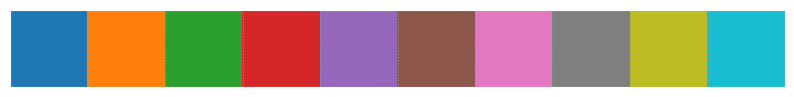

In [6]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
palette = sns.color_palette()
sns.palplot(palette)

In [7]:
warnings.filterwarnings("ignore", message="Palette images with Transparency expressed in bytes should be converted to RGBA images")

---

In [8]:
# При желании можно реализовать, используя все тот же ImageFolder
def save_dataset_annotation(dataset_path, save_path, save_format='csv'):
    train_dataset_ext_paths = []
    for img_path in glob.glob(f'{dataset_path}/*/*', recursive=True):
        if img_path.endswith(('png', 'jpg', 'jpeg')):
            class_name = os.path.basename(os.path.dirname(img_path))
            train_dataset_ext_paths.append({'image_path': img_path, 'label': class_name})

    df = pd.DataFrame(train_dataset_ext_paths)
    if save_format == 'csv':
        df.to_csv(save_path, index=False, header=True)
    elif save_format == 'json':
        df.to_json(save_path, orient='columns')
    else:
        raise Exception(f'{save_format} save format option is not available. Choose from "csv" or "json".')

In [9]:
train_224_path = PATH_224 / 'train'
annot_path = DATASET_PATH / 'annotations_224.csv'

if not os.path.exists(annot_path):
    save_dataset_annotation(train_224_path, annot_path)

annot_224 = pd.read_csv(annot_path)
display(annot_224.sample(5))

clean_a_bit()

,image_path,label
6739,datasets/dataset_224/train/Zoro/dbae86cc260e12...,Zoro
456,datasets/dataset_224/train/Crocodile/19ba09445...,Crocodile
8407,datasets/dataset_224/train/Law/02bc9a7b04f178e...,Law
6636,datasets/dataset_224/train/Zoro/32f24ab6a429dd...,Zoro
4766,datasets/dataset_224/train/Franky/175_a3cd2925...,Franky


In [10]:
train_path = PATH_BASE / 'train'
annot_path = DATASET_PATH / 'annotations.csv'

if not os.path.exists(annot_path):
    save_dataset_annotation(train_path, annot_path)

annot = pd.read_csv(annot_path)
display(annot.sample(5))

clean_a_bit()

,image_path,label
2780,datasets\splitted\train\Usopp\96.png,Usopp
1173,datasets\splitted\train\Jinbei\80.jpg,Jinbei
1840,datasets\splitted\train\Nami\159.png,Nami
228,datasets\splitted\train\Akainu\173.png,Akainu
925,datasets\splitted\train\Franky\191.png,Franky


---

## EDA

In [11]:
def show_examples(annot: pd.DataFrame, size=(350, 350), font_size: int = 30):

    n_cols, n_rows = 3, 6
    w, h = size
    labels = annot['label'].unique()

    grid_width = w * n_cols
    grid_height = h * n_rows
    grid = Image.new('RGB', size=(grid_width, grid_height))
    draw = ImageDraw.Draw(grid)

    try:
        font = ImageFont.truetype("arial.ttf", font_size)
        # font = ImageFont.load_default()
    except IOError:
        font = ImageFont.load_default()

    for i, label in enumerate(labels):
        col = i % n_cols
        row = i // n_cols
        box = (col * w, row * h)

        # Filter the dataset by a single label, shuffle it, and grab a few samples
        sampled_row = annot[annot['label'] == label].sample(n=1, random_state=12345)

        # Plot this label's examples along a row
        image = Image.open(sampled_row['image_path'].values[0].replace("\\", "/")) # replace for linux only
        grid.paste(image.resize(size), box=box)
        
        text_position = (box[0] + 5, box[1] + 5)

        for dx in range(-2, 2 + 1):
            for dy in range(-2, 2 + 1):
                if dx != 0 or dy != 0:
                    offset_position = (text_position[0] + dx, text_position[1] + dy)
                    draw.text(offset_position, label, font=font, fill=(255, 255, 255))

        draw.text(text_position, label, font=font, fill=(0, 0, 0))

    return grid

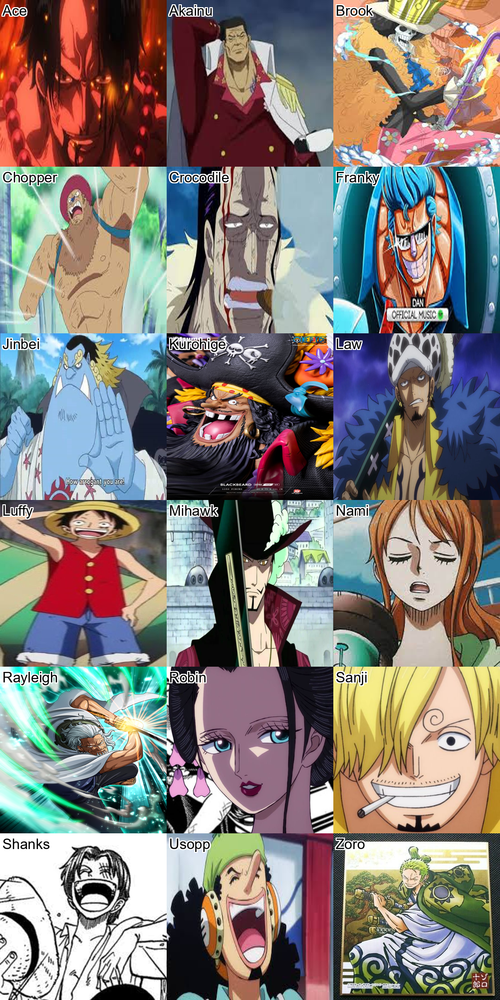

In [12]:
show_examples(annot)

In [13]:
def plot_kdes(df, xlim=(), ylim=(), rotation=0):

    class_sizes = df.groupby('label')['label'].count().sort_values(ascending=False)

    fig, axs = plt.subplots(1, 1, figsize=(10, 6), tight_layout=True)

    sns.barplot(x=class_sizes.index, y=class_sizes.values, color=qualitative.Plotly[0], ax=axs)
    axs.set_ylabel('Count', fontsize=13)
    axs.set_xlabel('Label', fontsize=13)
    axs.tick_params(axis='both', labelsize=11)
    axs.tick_params(axis='x', labelrotation=rotation)

    plt.suptitle(f"Histogram plot of label\n", fontsize=16)

    plt.show()

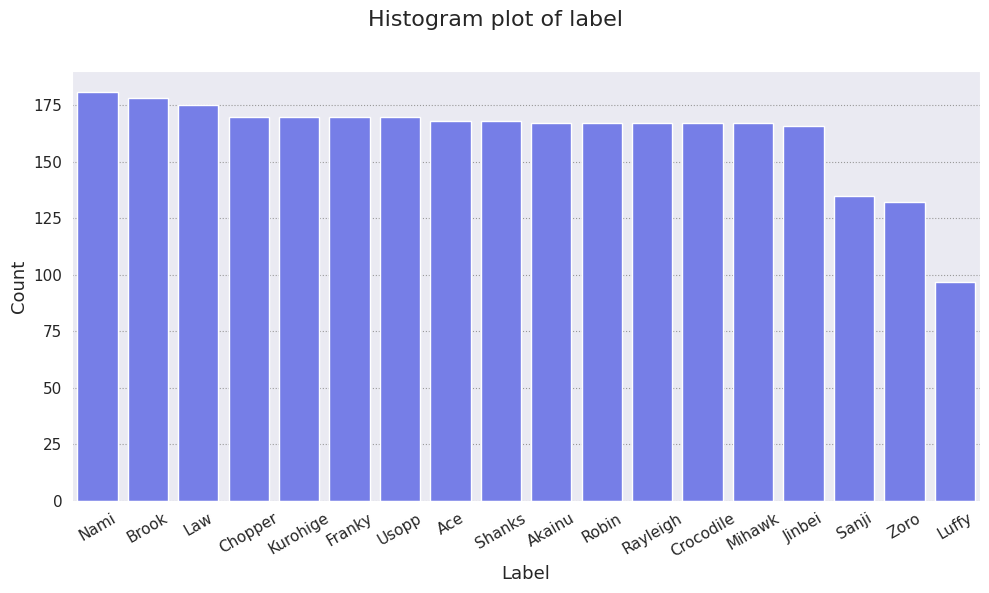

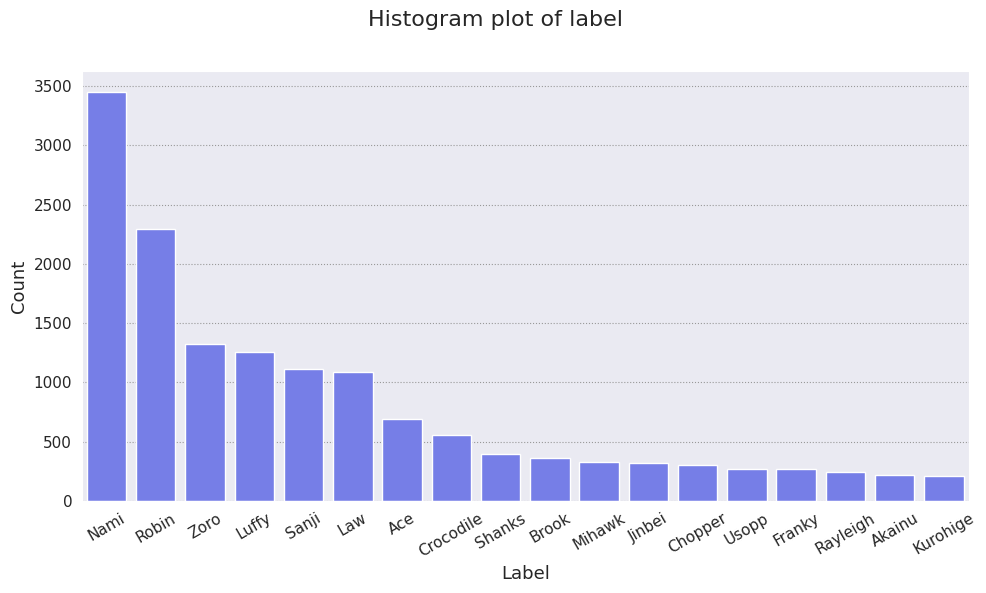

In [14]:
plot_kdes(annot, rotation=30)
plot_kdes(annot_224, rotation=30)

---

## Dataset preparations

In [24]:
transforms_ext = v2.Compose([
    # v2.ToImage(), # PILToTensor()
    # v2.RGB(),
    v2.ToDtype(torch.float32, scale=True),
])

transforms = v2.Compose([
    v2.Resize((224, 224), interpolation=v2.InterpolationMode.BILINEAR, antialias=True),
    v2.ToDtype(torch.float32, scale=True),
])

In [25]:
train_dataset_ext = ImageFolder(PATH_224 / 'train', transform=transforms_ext, loader=partial(decode_image, mode="RGB"))
train_dataset = ImageFolder(PATH_BASE / 'train', transform=transforms, loader=partial(decode_image, mode="RGB"))

In [26]:
idx_to_class = {v: k for k, v in train_dataset.class_to_idx.items()}

---

### Train-test split

In [27]:
def get_train_val_test_split_indices(dataset_len, class_labels, train_val_pct=(0.8, 0.1)):
    train_count = int(dataset_len * train_val_pct[0])
    val_count = int(dataset_len * train_val_pct[1])
    test_count = dataset_len - train_count - val_count

    indices = np.arange(0, dataset_len, 1)
    
    train_idx, val_idx = train_test_split(indices, train_size=train_count, test_size=val_count + test_count, 
                                          stratify=class_labels, random_state=SEED)
    val_idx, test_idx = train_test_split(val_idx, train_size=val_count, test_size=test_count, 
                                         stratify=class_labels[val_idx], random_state=SEED)
    
    return train_idx, val_idx, test_idx

In [28]:
train_ext_idx, val_ext_idx, test_ext_idx = get_train_val_test_split_indices(len(train_dataset_ext), 
                                                                            np.array(train_dataset_ext.targets),
                                                                            (0.7, 0.15))

In [29]:
train_idx, val_idx, test_idx = get_train_val_test_split_indices(len(train_dataset), 
                                                                np.array(train_dataset.targets),
                                                                (0.7, 0.15))

In [30]:
print(train_ext_idx.shape[0], val_ext_idx.shape[0], test_ext_idx.shape[0])
print(train_idx.shape[0], val_idx.shape[0], test_idx.shape[0])

10280 2203 2204
2040 437 438


---

### Class weights

In [67]:
def get_class_weights(dataset, method: Literal['balanced', 'normalized'] = 'normalized'):
    targets = torch.empty((len(dataset)), dtype=torch.int64)
    for i, (_, target) in enumerate(tq.tqdm(dataset)):
        targets[i] = target

    if method == 'balanced':
        n_samples = targets.size(0)
        class_weights = n_samples / (NUM_CLASSES * np.bincount(targets))
    elif method == 'normalized':
        class_counts = torch.bincount(targets)
        class_weights = 1.0 / class_counts.float()
        class_weights = class_weights / class_weights.sum() * len(class_weights)

    return class_weights

In [69]:
class_weights = get_class_weights(train_dataset_ext, 'normalized')
class_weights

  0%|          | 0/14687 [00:00<?, ?it/s]

tensor([0.6041, 1.9354, 1.1677, 1.3843, 0.7465, 1.5657, 1.2943, 2.0002, 0.3857,
        0.3336, 1.2784, 0.1211, 1.6994, 0.1820, 0.3749, 1.0557, 1.5541, 0.3167])

In [70]:
del train_dataset_ext

---

#### Mean/std evaluation helpers

In [71]:
def get_dataset_mean_std(dataset, file_path):

    pixel_sum = torch.zeros(3, device=device)
    pixel_sq_sum = torch.zeros(3, device=device)

    tmp_dataloader = DataLoader(dataset, batch_size=64, num_workers=2, pin_memory=True)

    with torch.no_grad():
        for img_batch, _ in tq.tqdm(tmp_dataloader):
            img_batch = img_batch.to(device)
            pixel_sum += img_batch.sum(axis=(0, 2, 3))
            pixel_sq_sum += (img_batch ** 2).sum(axis=(0, 2, 3))

    pixel_count = len(dataset) * img_batch.shape[2] * img_batch.shape[3]
    dataset_mean = pixel_sum / pixel_count
    dataset_std = torch.sqrt(pixel_sq_sum / pixel_count - dataset_mean ** 2)

    torch.save({'mean': dataset_mean.cpu(), 'std': dataset_std.cpu()}, file_path)

In [72]:
def load_dataset_mean_std(
    dataset: ImageFolder,
    img_size: int,
    idx: np.ndarray = None,
    file_name: str = 'mean_std'
):
    stats_path = DATASET_PATH / "img_stats" / f'{file_name}_{img_size}.pt'
    os.makedirs(os.path.dirname(stats_path), exist_ok=True)

    if idx is None:
        idx = np.arange(len(dataset))

    if not os.path.exists(stats_path):
        get_dataset_mean_std(Subset(dataset, idx), stats_path)

    dataset_stats = torch.load(stats_path, weights_only=True)

    clean_a_bit()

    return dataset_stats

---

#### Dataloader creation helpers

In [73]:
def prepare_dataloaders(dataset_path: Path,
                        split_indices: tuple[np.ndarray, np.ndarray, np.ndarray], # (train_idx, val_idx, test_idx)
                        transforms: tuple[v2.Compose, v2.Compose],
                        **dl_kwargs
    ) -> tuple[DataLoader, DataLoader, DataLoader]:

    _rng = torch.Generator().manual_seed(SEED)

    # Можно для большей красоты создать кастомный класс-датасет или функцию, создающую даталоадер,
    # и передавать в конструктор единственный инстанс ImageFolder и нужные трансформации. По идее,
    # если в классе будут храниться ссылки на объект ImageFolder, то это будет легкая экономия по памяти 
    ###########################################################################

    dataset_train    = ImageFolder(dataset_path, transform=transforms[0], loader=partial(decode_image, mode="RGB"))
    dataset_val_test = ImageFolder(dataset_path, transform=transforms[1], loader=partial(decode_image, mode="RGB"))

    subset_train = Subset(dataset_train, split_indices[0])
    subset_val   = Subset(dataset_val_test, split_indices[1])
    subset_test  = Subset(dataset_val_test, split_indices[2])

    # DataLoaders
    loader_train = DataLoader(subset_train, shuffle=True,
                              generator=_rng, **dl_kwargs)
    loader_val   = DataLoader(subset_val, shuffle=False,
                              generator=_rng, **dl_kwargs)
    loader_test  = DataLoader(subset_test, shuffle=False,
                              generator=_rng, **dl_kwargs)

    # loader_train = DataLoader(dataset_train, batch_size=batch_size, 
    #                             sampler=SubsetRandomSampler(split_indices[0], _rng), num_workers=num_workers)
    # loader_val   = DataLoader(dataset_val_test, batch_size=batch_size,
    #                             sampler=SubsetRandomSampler(split_indices[1], _rng), num_workers=num_workers)
    # loader_test  = DataLoader(dataset_val_test, batch_size=batch_size,
    #                             sampler=SubsetRandomSampler(split_indices[2], _rng), num_workers=num_workers)
    
    return loader_train, loader_val, loader_test

In [74]:
def visualize_batch(dataloader, idx_to_class, mean = None, std = None):
    batch = next(iter(dataloader))

    n_rows = batch[0].shape[0] // 4
    _, axes = plt.subplots(n_rows, 4, figsize=(12, 4 * n_rows), tight_layout=True)
    axes = axes.ravel()

    if not isinstance(mean, torch.Tensor):
        mean = torch.FloatTensor(mean)
    if not isinstance(std, torch.Tensor):
        std = torch.FloatTensor(std)

    for i, (img, label) in enumerate(zip(*batch)):
        if std is not None:
            img *= std.view(-1, 1, 1)
        if mean is not None:
            img += mean.view(-1, 1, 1)

        axes[i].imshow(img.permute(1, 2, 0).numpy())
        axes[i].axis('off')
        axes[i].set_title(idx_to_class[label.item()], fontsize=14)

    plt.show()

---

## Model experimenting

In [ ]:
train_results, test_results, true_test_results = {}, {}, {}

In [75]:
weights = EfficientNet_V2_S_Weights.IMAGENET1K_V1

In [76]:
train_transforms = v2.Compose([
    v2.RandomResizedCrop(size=(384, 384), scale=(0.8, 1.0), antialias=True),
    v2.RandomHorizontalFlip(),
    v2.TrivialAugmentWide(num_magnitude_bins=31, interpolation=v2.InterpolationMode.BILINEAR),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=weights.transforms().mean, std=weights.transforms().std),
    v2.RandomErasing(p=0.25),
])

test_transforms = v2.Compose([
    v2.CenterCrop((384, 384)),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=weights.transforms().mean, std=weights.transforms().std)
])

In [77]:
# # На будущее
# cutmix = v2.CutMix(num_classes=NUM_CLASSES)
# mixup = v2.MixUp(num_classes=NUM_CLASSES)
# cutmix_or_mixup = v2.RandomChoice([cutmix, mixup])

# def collate_fn(batch):
#     return cutmix_or_mixup(*default_collate(batch))

In [78]:
train_loader_384, val_loader_384, test_loader_384 = prepare_dataloaders(os.path.join(PATH_384, 'train'),
                                                                        (train_ext_idx, val_ext_idx, test_ext_idx),
                                                                        transforms=(train_transforms, test_transforms),
                                                                        batch_size=32,
                                                                        num_workers=4,
                                                                        pin_memory=True)

In [80]:
# Alert!!! 18+
# visualize_batch(train_loader_384, idx_to_class, mean=weights.transforms().mean, std=weights.transforms().std)

##### True test

In [81]:
true_test_transforms = v2.Compose([
    v2.Resize(384, interpolation=v2.InterpolationMode.BILINEAR, antialias=True),
    v2.CenterCrop(384),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=weights.transforms().mean, std=weights.transforms().std)
])

In [84]:
true_test_dataset = ImageFolder(os.path.join(PATH_BASE, 'test_classified'), 
                                transform=true_test_transforms, loader=partial(decode_image, mode="RGB"))
random.shuffle(true_test_dataset.samples)

test_classified_loader = DataLoader(true_test_dataset, batch_size=16, shuffle=True, 
                                    num_workers=2, pin_memory=True, generator=torch.Generator().manual_seed(SEED))

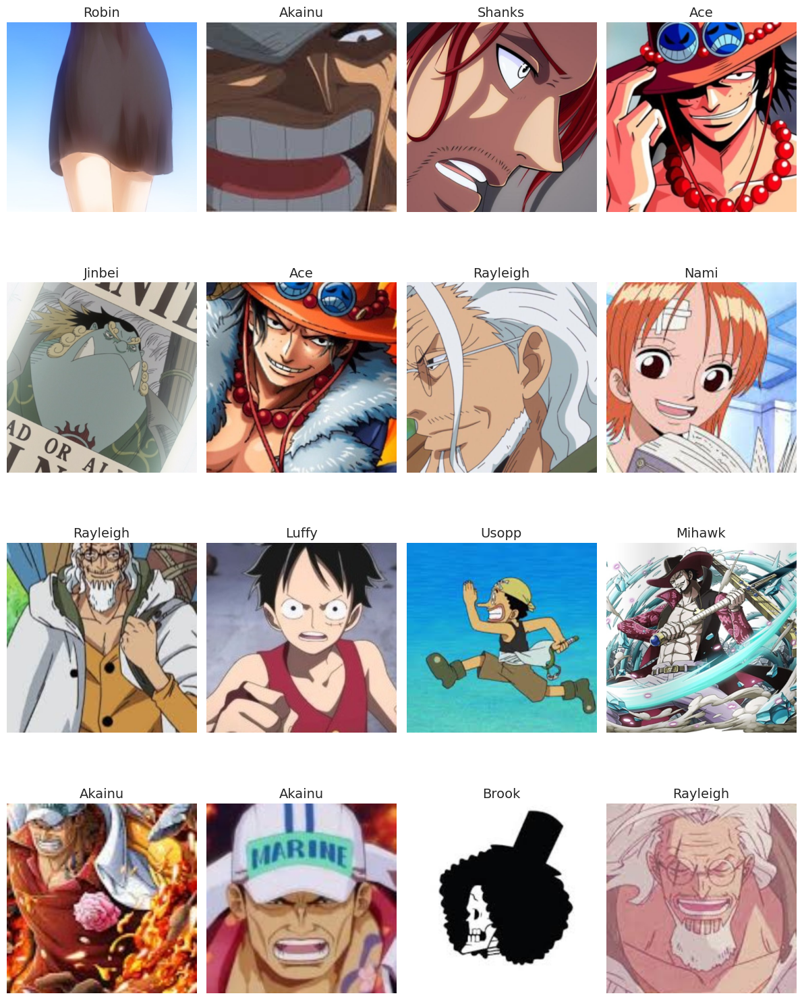

In [85]:
visualize_batch(test_classified_loader, idx_to_class, mean=weights.transforms().mean, std=weights.transforms().std)

---

---

### Train / validation functions

In [86]:
class TrainingPlotter:
    def __init__(self, metrics: list[str] = ['accuracy'], title="Training Progress"):
        self.metrics = metrics
        self.history = {
            'epochs': [],
            'Train Loss': [], 'Valid Loss': []
        }
        for m in self.metrics:
            self.history[f'Train {m}'] = []
            self.history[f'Valid {m}'] = []

        self.out_widget = widgets.Output()

        total_panels = 1 + len(metrics)  # Loss + each metric
        cols = 1 if total_panels == 1 else 2
        rows = math.ceil(total_panels / cols)

        subplot_titles = ("Loss",) + tuple(m.capitalize() for m in metrics)

        self.fig = make_subplots(
            rows=rows,
            cols=cols,
            subplot_titles=subplot_titles
        )

        def panel_rc(panel_index: int) -> tuple[int, int]:
            """panel_index is 0-based across panels left->right, top->bottom."""
            r = panel_index // cols + 1  # plotly is 1-based
            c = panel_index % cols + 1
            return r, c

        # Add Loss traces to panel 0
        r, c = panel_rc(0)
        self._add_trace(r, c, "Train Loss", "blue")
        self._add_trace(r, c, "Valid Loss", "orange")

        # Add legend
        self._add_manual_legend()

        # Add Metric traces to panels 1..N
        for i, m in enumerate(metrics, start=1):
            r, c = panel_rc(i)
            self._add_trace(r, c, f"Train {m}", "blue", dashed=True)
            self._add_trace(r, c, f"Valid {m}", "orange", dashed=True)

        self.fig.update_layout(
            title=title,
            width=1100,
            height=350 * rows,  # scale height with rows
            showlegend=False,
            margin=dict(l=20, r=20, t=60, b=20)
        )

        self.display_id = str(uuid.uuid4())
        self._handle = None

    def _add_trace(self, row, col, name, color, dashed=False):
        line_style = dict(color=color)
        if dashed:
            line_style['dash'] = 'dash'
        self.fig.add_trace(
            go.Scatter(x=[], y=[], mode='lines+markers', name=name, line=line_style),
            row=row, col=col
        )

    def _add_manual_legend(self):
        legend_items = [
            ("Train", "blue", "solid"),
            ("Valid", "orange", "dash"),
        ]

        x0 = 0.9
        y0 = 0.5
        dy = 0.08

        for i, (label, color, dash) in enumerate(legend_items):
            y = y0 - i * dy

            self.fig.add_shape(
                type="line",
                xref="paper", yref="paper",
                x0=x0, x1=x0 + 0.06,
                y0=y, y1=y,
                line=dict(color=color, width=3, dash=dash),
            )

            self.fig.add_annotation(
                xref="paper", yref="paper",
                x=x0 + 0.07,
                y=y,
                text=label,
                showarrow=False,
                xanchor="left",
                yanchor="middle",
                font=dict(size=12),
            )

    def display(self):
        display(self.out_widget)

    def update(self, epoch, train_loss, valid_loss, metric_dict_train, metric_dict_valid):
        self.history['epochs'].append(epoch + 1)
        self.history['Train Loss'].append(train_loss)
        self.history['Valid Loss'].append(valid_loss)

        for m in self.metrics:
            self.history[f'Train {m}'].append(metric_dict_train.get(m, 0))
            self.history[f'Valid {m}'].append(metric_dict_valid.get(m, 0))

        with self.fig.batch_update():
            # Loss traces are always data[0] and data[1]
            self.fig.data[0].x = self.history['epochs']
            self.fig.data[0].y = self.history['Train Loss']
            self.fig.data[1].x = self.history['epochs']
            self.fig.data[1].y = self.history['Valid Loss']

            # Metrics: 2 traces per metric after the first two loss traces
            trace_idx = 2
            for m in self.metrics:
                self.fig.data[trace_idx].x = self.history['epochs']
                self.fig.data[trace_idx].y = self.history[f'Train {m}']
                trace_idx += 1

                self.fig.data[trace_idx].x = self.history['epochs']
                self.fig.data[trace_idx].y = self.history[f'Valid {m}']
                trace_idx += 1

        with self.out_widget:
            clear_output(wait=True)
            self.fig.show()

In [87]:
def train_epoch(data_loader, model, loss_fn, optimizer, device, metrics: MetricCollection = {}):
    
    model.train()
    train_loss = 0.

    metrics.reset()

    for img_batch, labels in tq.tqdm(data_loader, desc='Training', leave=False):
        img_batch, labels = img_batch.to(device), labels.to(device)

        if model._get_name() not in ['BeitForImageClassification']:
            logits = model(img_batch)
        else:
            logits = model(img_batch).logits
        loss = loss_fn(logits, labels)
        train_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        metrics.update(torch.argmax(logits, dim=1), labels)

    train_loss /= len(data_loader)

    metric_values = {name: metric.item() for name, metric in metrics.compute().items()}

    return train_loss, metric_values

In [88]:
def test_epoch(data_loader, model, loss_fn, device, metrics: MetricCollection = {}):
    
    model.eval()
    test_loss = 0.
    
    metrics.reset()

    with torch.no_grad():
        for img_batch, labels in tq.tqdm(data_loader, desc='Evaluation', leave=False):
            img_batch, labels = img_batch.to(device), labels.to(device)
            
            if model._get_name() not in ['BeitForImageClassification']:
                logits = model(img_batch)
            else:
                logits = model(img_batch).logits
            loss = loss_fn(logits, labels)
            test_loss += loss.item()
            metrics.update(torch.argmax(logits, dim=1), labels)

    test_loss  = test_loss / len(data_loader)
    
    metric_values = {name: metric.item() for name, metric in metrics.compute().items()}

    return test_loss, metric_values

In [89]:
def train_model(
                model,
                train_loader: DataLoader,
                test_loader: DataLoader,
                num_epochs: int,
                loss_fn: callable,
                optimizer: torch.optim.Optimizer,
                device: torch.device
    ):
    
    results = {
        'Train Loss': [],
        'Valid Loss': [],
        'Train f1_micro': [],
        'Valid f1_micro': [],
        'Train f1_macro': [],
        'Valid f1_macro': [],
        'Train f1_weighted': [],
        'Valid f1_weighted': [],
    }

    metrics = MetricCollection({
        'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
        'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
        'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })

    # ----- DYNAMIC PLOT ----- #
    
    plotter = TrainingPlotter(metrics=metrics.keys())
    plotter.display()

    # ------------------------ #

    model.to(device)

    for epoch in tq.tqdm(range(num_epochs), desc='Epoch'):
        start_time = perf_counter()
        train_loss, train_metrics = train_epoch(
            train_loader,
            model,
            loss_fn,
            optimizer,
            device,
            metrics
        )
        end_train_time = perf_counter()

        test_loss, test_metrics = test_epoch(
            test_loader,
            model,
            loss_fn,
            device,
            metrics
        )
        end_test_time = perf_counter()

        train_time = end_train_time - start_time
        valid_time = end_test_time - end_train_time

        print(f'Epoch {epoch}')

        for prefix, loss, metric_dict, elapsed in (
            ('Train', train_loss, train_metrics, train_time),
            ('Valid', test_loss,  test_metrics,  valid_time),
        ):
            parts = [f"{prefix} Loss (CE): {loss:6.4f}"]
            parts.append(f"{prefix} F1 micro: {metric_dict['f1_micro']:6.4f}")
            parts.append(f"{prefix} F1 macro: {metric_dict['f1_macro']:6.4f}")
            parts.append(f"{prefix} F1 weighted: {metric_dict['f1_weighted']:6.4f}")
            parts.append(f"{prefix} Time: {elapsed:6.2f}s")
            print(" | ".join(parts))
        print("-" * 216)

        results['Train Loss'].append(train_loss)
        results['Valid Loss'].append(test_loss)
        for key in metrics.keys():
            results[f'Train {key}'].append(train_metrics[key])
            results[f'Valid {key}'].append(test_metrics[key])

        # ----- Dynamic Plotly update ----- 
        plotter.update(
            epoch=epoch,
            train_loss=train_loss,
            valid_loss=test_loss,
            metric_dict_train=train_metrics,
            metric_dict_valid=test_metrics
        )

    return results

In [90]:
def plot_metrics(results):
    _, axs = plt.subplots(len(results.keys()) // 2, 1, figsize=(10, 6 * len(results.keys()) // 2), tight_layout=True)
    plt.suptitle('Training and Validation Loss & F1', fontsize=16)

    i, j = 0, 0
    for metric_name, metric_values in results.items():
        sns.lineplot(metric_values, 
                     label=metric_name, 
                     linestyle='-' if i % 2 == 0 else '--',
                     marker='o',
                     linewidth=2, 
                     color=qualitative.Plotly[i], 
                     ax=axs[j])
        if i:
            j +=1
        i ^= 1

    plt.legend()
    for i in range(4): # len(results.keys()) // 2
        axs[i].set_xticks(range(0, len(metric_values)))
        axs[i].set_xticklabels(range(1, len(metric_values) + 1))

    plt.show()

---

---

### EfficientNet_v2_s (transfer learning, new domain)

In [91]:
efficientnet_s_model = efficientnet_v2_s(weights=weights)

In [92]:
for param in efficientnet_s_model.parameters():
    param.requires_grad = False

efficientnet_s_model.classifier[1] = nn.Linear(in_features=efficientnet_s_model.classifier[1].in_features, 
                                               out_features=NUM_CLASSES, 
                                               bias=True)

trainable_params = [param for param in efficientnet_s_model.parameters() if param.requires_grad]

In [94]:
summary(efficientnet_s_model,
        input_size=(32, 3, 384, 384),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 384, 384]    [32, 18]             --                   Partial
├─Sequential (features)                                      [32, 3, 384, 384]    [32, 1280, 12, 12]   --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 384, 384]    [32, 24, 192, 192]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 384, 384]    [32, 24, 192, 192]   (648)                False
│    │    └─BatchNorm2d (1)                                  [32, 24, 192, 192]   [32, 24, 192, 192]   (48)                 False
│    │    └─SiLU (2)                                         [32, 24, 192, 192]   [32, 24, 192, 192]   --                   --
│    └─Sequential (1)                                        [32, 24, 192, 192]   [32, 

In [97]:
loss_fn = nn.CrossEntropyLoss(weight=class_weights.to(device))
optimizer = Adam(trainable_params, lr=1e-3)

In [ ]:
train_results['efficientnet'] = train_model(efficientnet_s_model,
                                            train_loader_384,
                                            val_loader_384,
                                            10,
                                            loss_fn,
                                            optimizer,
                                            device)

Output()

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 0
Train Loss (CE): 2.0999 | Train F1 micro: 0.5002 | Train F1 macro: 0.4018 | Train F1 weighted: 0.5094 | Train Time:  59.88s
Valid Loss (CE): 1.6194 | Valid F1 micro: 0.6151 | Valid F1 macro: 0.5368 | Valid F1 weighted: 0.6221 | Valid Time:  11.86s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1
Train Loss (CE): 1.5077 | Train F1 micro: 0.6068 | Train F1 macro: 0.5288 | Train F1 weighted: 0.6164 | Train Time:  59.91s
Valid Loss (CE): 1.3439 | Valid F1 micro: 0.6482 | Valid F1 macro: 0.5870 | Valid F1 weighted: 0.6539 | Valid Time:  12.24s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2
Train Loss (CE): 1.3426 | Train F1 micro: 0.6314 | Train F1 macro: 0.5631 | Train F1 weighted: 0.6403 | Train Time:  60.91s
Valid Loss (CE): 1.2092 | Valid F1 micro: 0.6664 | Valid F1 macro: 0.6061 | Valid F1 weighted: 0.6703 | Valid Time:  12.38s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3
Train Loss (CE): 1.2413 | Train F1 micro: 0.6478 | Train F1 macro: 0.5781 | Train F1 weighted: 0.6567 | Train Time:  61.23s
Valid Loss (CE): 1.1681 | Valid F1 micro: 0.6527 | Valid F1 macro: 0.5952 | Valid F1 weighted: 0.6594 | Valid Time:  12.48s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4
Train Loss (CE): 1.1800 | Train F1 micro: 0.6541 | Train F1 macro: 0.5950 | Train F1 weighted: 0.6621 | Train Time:  62.68s
Valid Loss (CE): 1.1312 | Valid F1 micro: 0.6577 | Valid F1 macro: 0.6001 | Valid F1 weighted: 0.6644 | Valid Time:  12.71s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5
Train Loss (CE): 1.1298 | Train F1 micro: 0.6605 | Train F1 macro: 0.5999 | Train F1 weighted: 0.6684 | Train Time:  62.24s
Valid Loss (CE): 1.1003 | Valid F1 micro: 0.6736 | Valid F1 macro: 0.6182 | Valid F1 weighted: 0.6798 | Valid Time:  12.73s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6
Train Loss (CE): 1.1276 | Train F1 micro: 0.6692 | Train F1 macro: 0.6130 | Train F1 weighted: 0.6762 | Train Time:  62.68s
Valid Loss (CE): 1.0851 | Valid F1 micro: 0.6773 | Valid F1 macro: 0.6273 | Valid F1 weighted: 0.6844 | Valid Time:  12.71s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7
Train Loss (CE): 1.0781 | Train F1 micro: 0.6690 | Train F1 macro: 0.6111 | Train F1 weighted: 0.6767 | Train Time:  62.84s
Valid Loss (CE): 1.0313 | Valid F1 micro: 0.6854 | Valid F1 macro: 0.6329 | Valid F1 weighted: 0.6913 | Valid Time:  12.63s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8
Train Loss (CE): 1.0879 | Train F1 micro: 0.6686 | Train F1 macro: 0.6097 | Train F1 weighted: 0.6762 | Train Time:  62.75s
Valid Loss (CE): 1.0465 | Valid F1 micro: 0.6773 | Valid F1 macro: 0.6280 | Valid F1 weighted: 0.6854 | Valid Time:  12.79s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9
Train Loss (CE): 1.0548 | Train F1 micro: 0.6735 | Train F1 macro: 0.6186 | Train F1 weighted: 0.6811 | Train Time:  63.03s
Valid Loss (CE): 1.0213 | Valid F1 micro: 0.6963 | Valid F1 macro: 0.6433 | Valid F1 weighted: 0.7013 | Valid Time:  12.79s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


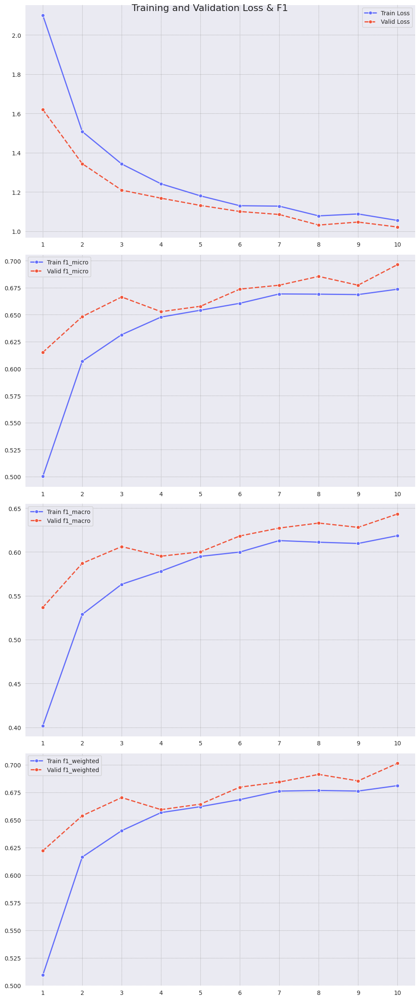

In [ ]:
plot_metrics(train_results['efficientnet'])

In [102]:
test_results['efficient_net'] = test_epoch(
    test_loader_384, efficientnet_s_model, loss_fn, device, 
    metrics = MetricCollection({
        'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
        'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
        'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

In [103]:
print(f"Test loss: {test_results['efficient_net'][0]:4f} | ",
      f"F1 micro: {test_results['efficient_net'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {test_results['efficient_net'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {test_results['efficient_net'][1]['f1_weighted']:.3f}")

Test loss: 0.939238 |  F1 micro: 0.726 |  F1 macro: 0.669 |  F1 weighted: 0.731


In [104]:
true_test_results['efficient_net'] = test_epoch(
    test_classified_loader, efficientnet_s_model, loss_fn, device, 
    metrics = MetricCollection({
          'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
          'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
          'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/54 [00:00<?, ?it/s]

In [105]:
print(f"Test loss: {true_test_results['efficient_net'][0]:4f} | ",
      f"F1 micro: {true_test_results['efficient_net'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {true_test_results['efficient_net'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {true_test_results['efficient_net'][1]['f1_weighted']:.3f}")

Test loss: 0.653960 |  F1 micro: 0.775 |  F1 macro: 0.769 |  F1 weighted: 0.772


In [106]:
clean_a_bit()

In [107]:
efficientnet_s_model.cpu()
del efficientnet_s_model

---

---

### BEiT (transfer learning, same domain)

In [108]:
preprocessor = BeitImageProcessor.from_pretrained('microsoft/beit-base-patch16-224-pt22k-ft22k')

/home/lighter_01/.pyenv/versions/wsl_main/lib/python3.11/site-packages/transformers/utils/deprecation.py:172: UserWarning:

The following named arguments are not valid for `BeitImageProcessor.__init__` and were ignored: 'feature_extractor_type'



In [109]:
def collate_fn(batch):
    if isinstance(batch[0][0], BatchFeature):
        pixels = torch.stack([torch.tensor(x[0]['pixel_values'][0]) for x in batch])
        labels = torch.stack([torch.tensor(x[1]) for x in batch])
    else:
        pixels = torch.stack([x[0] for x in batch])
        labels = torch.stack([torch.tensor(x[1]) for x in batch])        
    return pixels, labels

In [159]:
train_transforms = v2.Compose([
    v2.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), antialias=True),
    v2.RandomHorizontalFlip(),
    v2.TrivialAugmentWide(num_magnitude_bins=31, interpolation=v2.InterpolationMode.BILINEAR),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=preprocessor.image_mean, std=preprocessor.image_std),
    v2.RandomErasing(p=0.25, scale=(0.02, 0.25))
])

test_transforms = v2.Compose([
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=preprocessor.image_mean, std=preprocessor.image_std)
])

In [160]:
train_loader_224, val_loader_224, test_loader_224 = prepare_dataloaders(os.path.join(PATH_224, 'train'),
                                                                        (train_ext_idx, val_ext_idx, test_ext_idx),
                                                                        transforms=(train_transforms, test_transforms),
                                                                        batch_size=16,
                                                                        num_workers=2,
                                                                        pin_memory=True,
                                                                        collate_fn=collate_fn)

In [60]:
# Alert !!! 18+
# visualize_batch(train_loader_224, idx_to_class, mean=preprocessor.image_mean, std=preprocessor.image_std)

##### True test

In [161]:
true_test_transforms = v2.Compose([
    v2.Resize((224, 224), interpolation=v2.InterpolationMode.BILINEAR, antialias=True),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=preprocessor.image_mean, std=preprocessor.image_std)
])

In [162]:
test_dataset = ImageFolder(os.path.join(PATH_BASE, 'test_classified'), 
                           transform=true_test_transforms, loader=partial(decode_image, mode="RGB"))
# random.shuffle(test_dataset.samples)

test_classified_loader = DataLoader(test_dataset, batch_size=16, shuffle=True, 
                                    num_workers=2, pin_memory=True, generator=torch.Generator().manual_seed(SEED))

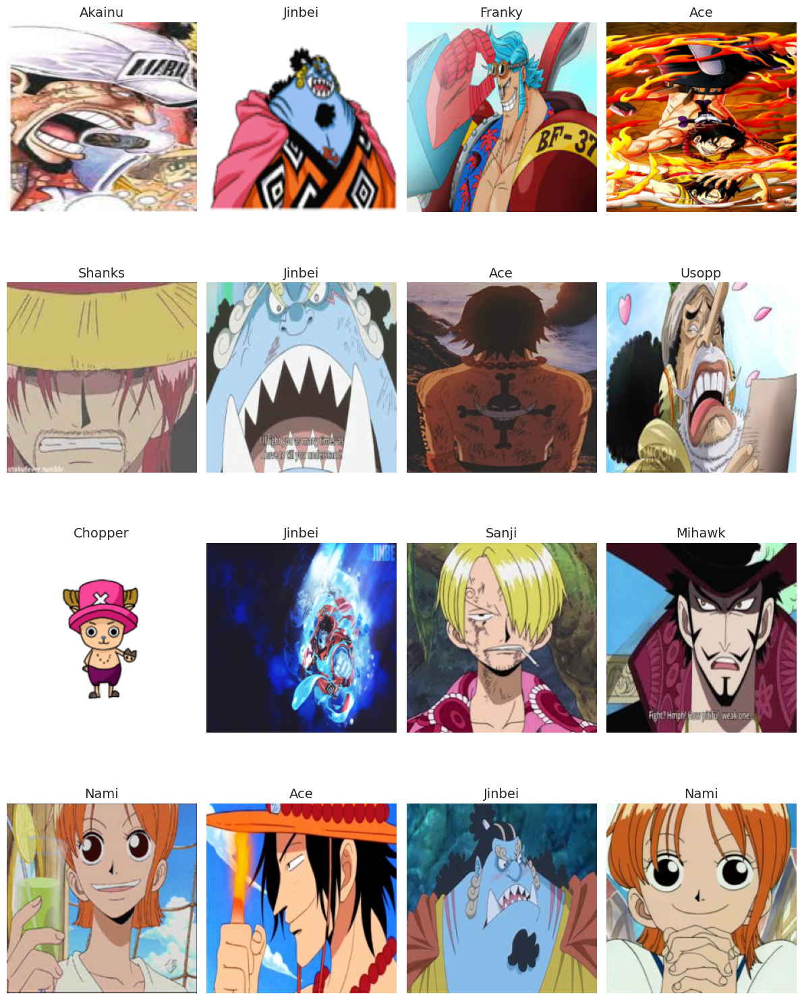

In [164]:
visualize_batch(test_classified_loader, idx_to_class, mean=preprocessor.image_mean, std=preprocessor.image_std)

---

##### Model

In [213]:
beit_config = BeitConfig.from_pretrained('microsoft/beit-base-patch16-224-pt22k-ft22k', attn_implementation='eager')
beit_config.num_labels = 3263
beit_config._attn_implementation

'eager'

In [214]:
beit_model = BeitForImageClassification(beit_config).to('cpu')

In [215]:
ckpt_path = os.path.join('saved_models', 'beit-base-patch16-224-pt22k-ft22k-dafre.ckpt')

checkpoint = torch.load(ckpt_path, map_location=torch.device('cpu'), weights_only=True)

In [216]:
# beit_model.state_dict().keys()

In [217]:
# checkpoint['state_dict'].keys()

In [218]:
adjusted_state_dict = OrderedDict()
for key, value in checkpoint['state_dict'].items():
    if key.startswith('net.'):
        new_key = key[4:]
    else:
        new_key = key
    adjusted_state_dict[new_key] = value

In [219]:
for key in adjusted_state_dict.keys():
    if key not in beit_model.state_dict().keys():
        print(key)

beit.encoder.layer.0.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.1.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.2.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.3.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.4.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.5.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.6.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.7.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.8.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.9.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.10.attention.attention.relative_position_bias.relative_position_index
beit.encoder.layer.11.attention

In [220]:
beit_model.load_state_dict(adjusted_state_dict, strict=False)

_IncompatibleKeys(missing_keys=[], unexpected_keys=['beit.encoder.layer.0.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.1.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.2.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.3.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.4.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.5.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.6.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.7.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.8.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.9.attention.attention.relative_position_bias.relative_position_index', 'beit.encoder.layer.10.attention.atten

In [221]:
for param in beit_model.parameters():
    param.requires_grad = False

beit_model.classifier = nn.Linear(in_features=beit_model.classifier.in_features, 
                                  out_features=NUM_CLASSES, 
                                  bias=True)

trainable_params = [param for param in beit_model.parameters() if param.requires_grad]
beit_model.classifier

Linear(in_features=768, out_features=18, bias=True)

In [222]:
summary(beit_model,
        input_size=(16, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                                               Input Shape          Output Shape         Param #              Trainable
BeitForImageClassification (BeitForImageClassification)                               [16, 3, 224, 224]    [16, 18]             --                   Partial
├─BeitModel (beit)                                                                    [16, 3, 224, 224]    [16, 768]            --                   False
│    └─BeitEmbeddings (embeddings)                                                    [16, 3, 224, 224]    [16, 197, 768]       768                  False
│    │    └─BeitPatchEmbeddings (patch_embeddings)                                    [16, 3, 224, 224]    [16, 196, 768]       (590,592)            False
│    │    └─Dropout (dropout)                                                         [16, 197, 768]       [16, 197, 768]       --                   --
│    └─BeitEncoder (encoder)                                       

In [223]:
optimizer = Adam(trainable_params, lr=1e-3)

In [ ]:
train_results['beit'] = train_model(beit_model,
                                    train_loader_224,
                                    val_loader_224,
                                    10,
                                    loss_fn,
                                    optimizer,
                                    device)

Output()

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 0
Train Loss (CE): 1.5033 | Train F1 micro: 0.6729 | Train F1 macro: 0.5842 | Train F1 weighted: 0.6857 | Train Time:  74.62s
Valid Loss (CE): 0.9232 | Valid F1 micro: 0.7780 | Valid F1 macro: 0.7320 | Valid F1 weighted: 0.7849 | Valid Time:  16.06s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 1
Train Loss (CE): 0.9214 | Train F1 micro: 0.7679 | Train F1 macro: 0.7091 | Train F1 weighted: 0.7734 | Train Time:  81.14s
Valid Loss (CE): 0.7614 | Valid F1 micro: 0.7944 | Valid F1 macro: 0.7540 | Valid F1 weighted: 0.8003 | Valid Time:  17.12s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 2
Train Loss (CE): 0.7841 | Train F1 micro: 0.7902 | Train F1 macro: 0.7445 | Train F1 weighted: 0.7941 | Train Time:  85.60s
Valid Loss (CE): 0.6986 | Valid F1 micro: 0.8021 | Valid F1 macro: 0.7640 | Valid F1 weighted: 0.8066 | Valid Time:  18.00s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 3
Train Loss (CE): 0.7204 | Train F1 micro: 0.7988 | Train F1 macro: 0.7527 | Train F1 weighted: 0.8027 | Train Time:  85.30s
Valid Loss (CE): 0.6658 | Valid F1 micro: 0.8071 | Valid F1 macro: 0.7721 | Valid F1 weighted: 0.8125 | Valid Time:  17.89s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 4
Train Loss (CE): 0.6655 | Train F1 micro: 0.8077 | Train F1 macro: 0.7692 | Train F1 weighted: 0.8116 | Train Time:  85.10s
Valid Loss (CE): 0.6452 | Valid F1 micro: 0.8084 | Valid F1 macro: 0.7751 | Valid F1 weighted: 0.8131 | Valid Time:  17.88s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 5
Train Loss (CE): 0.6276 | Train F1 micro: 0.8124 | Train F1 macro: 0.7745 | Train F1 weighted: 0.8155 | Train Time:  86.28s
Valid Loss (CE): 0.6378 | Valid F1 micro: 0.8044 | Valid F1 macro: 0.7699 | Valid F1 weighted: 0.8109 | Valid Time:  18.23s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 6
Train Loss (CE): 0.6242 | Train F1 micro: 0.8129 | Train F1 macro: 0.7750 | Train F1 weighted: 0.8157 | Train Time:  85.71s
Valid Loss (CE): 0.6132 | Valid F1 micro: 0.8171 | Valid F1 macro: 0.7852 | Valid F1 weighted: 0.8205 | Valid Time:  18.01s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 7
Train Loss (CE): 0.6011 | Train F1 micro: 0.8190 | Train F1 macro: 0.7818 | Train F1 weighted: 0.8220 | Train Time:  85.94s
Valid Loss (CE): 0.6060 | Valid F1 micro: 0.8180 | Valid F1 macro: 0.7868 | Valid F1 weighted: 0.8212 | Valid Time:  18.23s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 8
Train Loss (CE): 0.5576 | Train F1 micro: 0.8285 | Train F1 macro: 0.7978 | Train F1 weighted: 0.8310 | Train Time:  87.51s
Valid Loss (CE): 0.5951 | Valid F1 micro: 0.8198 | Valid F1 macro: 0.7873 | Valid F1 weighted: 0.8225 | Valid Time:  18.61s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/643 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

Epoch 9
Train Loss (CE): 0.5725 | Train F1 micro: 0.8234 | Train F1 macro: 0.7875 | Train F1 weighted: 0.8259 | Train Time:  86.29s
Valid Loss (CE): 0.6034 | Valid F1 micro: 0.8153 | Valid F1 macro: 0.7808 | Valid F1 weighted: 0.8203 | Valid Time:  18.04s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


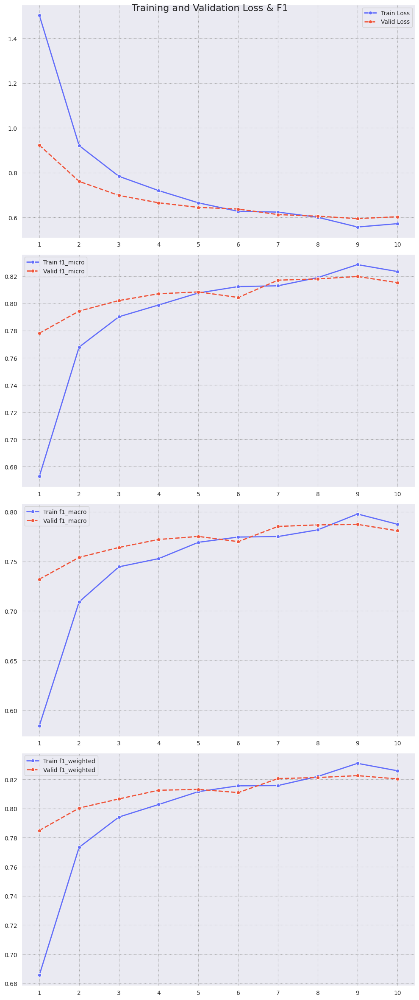

In [ ]:
plot_metrics(train_results['beit'])

In [226]:
test_results['beit'] = test_epoch(
    test_loader_224, beit_model, loss_fn, device, 
    metrics = MetricCollection({
        'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
        'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
        'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/138 [00:00<?, ?it/s]

In [227]:
print(f"Test loss: {test_results['beit'][0]:4f} | ",
      f"F1 micro: {test_results['beit'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {test_results['beit'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {test_results['beit'][1]['f1_weighted']:.3f}")

Test loss: 0.623875 |  F1 micro: 0.828 |  F1 macro: 0.778 |  F1 weighted: 0.833


In [228]:
true_test_results['beit'] = test_epoch(
    test_classified_loader, beit_model, loss_fn, device, 
    metrics = MetricCollection({
        'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
        'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
        'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/54 [00:00<?, ?it/s]

In [229]:
print(f"Test loss: {true_test_results['beit'][0]:4f} | ",
      f"F1 micro: {true_test_results['beit'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {true_test_results['beit'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {true_test_results['beit'][1]['f1_weighted']:.3f}")

Test loss: 0.282332 |  F1 micro: 0.915 |  F1 macro: 0.915 |  F1 weighted: 0.915


In [230]:
clean_a_bit()

In [231]:
beit_model.to('cpu')
del beit_model

---

---

## ResNet-50 (from scratch)

In [253]:
transforms = v2.Compose([
    v2.CenterCrop(size=(224, 224)),
    v2.ToDtype(torch.float32, scale=True),
])

In [254]:
train_dataset_232 = ImageFolder(PATH_232 / 'train', transform=transforms, loader=partial(decode_image, mode="RGB"))

In [255]:
dataset_ext_stats_232 = load_dataset_mean_std(train_dataset_232, 232, train_ext_idx, 'mean_std_ext')

In [256]:
train_transforms = v2.Compose([
    v2.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), antialias=True),
    v2.RandomHorizontalFlip(),
    v2.TrivialAugmentWide(num_magnitude_bins=31, interpolation=v2.InterpolationMode.BILINEAR),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=dataset_ext_stats_232['mean'], std=dataset_ext_stats_232['std']),
    v2.RandomErasing(p=0.25),
])

test_transforms = v2.Compose([
    v2.CenterCrop(size=224),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=dataset_ext_stats_232['mean'], std=dataset_ext_stats_232['std'])
])

In [257]:
train_loader_232, val_loader_232, test_loader_232 = prepare_dataloaders(os.path.join(PATH_232, 'train'),
                                                                        (train_ext_idx, val_ext_idx, test_ext_idx),
                                                                        transforms=(train_transforms, test_transforms),
                                                                        batch_size=32,
                                                                        num_workers=4,
                                                                        pin_memory=True)

In [258]:
# Alert!!! 18+
# visualize_batch(train_loader_232, idx_to_class, mean=dataset_ext_stats_232['mean'], std=dataset_ext_stats_232['std'])

##### True test

In [259]:
true_test_transforms = v2.Compose([
    v2.Resize(size=224, interpolation=v2.InterpolationMode.BILINEAR, antialias=True),
    v2.CenterCrop(224),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=dataset_ext_stats_232['mean'], std=dataset_ext_stats_232['std'])
])

In [260]:
true_test_dataset = ImageFolder(os.path.join(PATH_BASE, 'test_classified'), 
                                transform=true_test_transforms, loader=partial(decode_image, mode="RGB"))
random.shuffle(true_test_dataset.samples)

test_classified_loader = DataLoader(true_test_dataset, batch_size=16, shuffle=True, 
                                    num_workers=2, pin_memory=True, generator=torch.Generator().manual_seed(SEED))

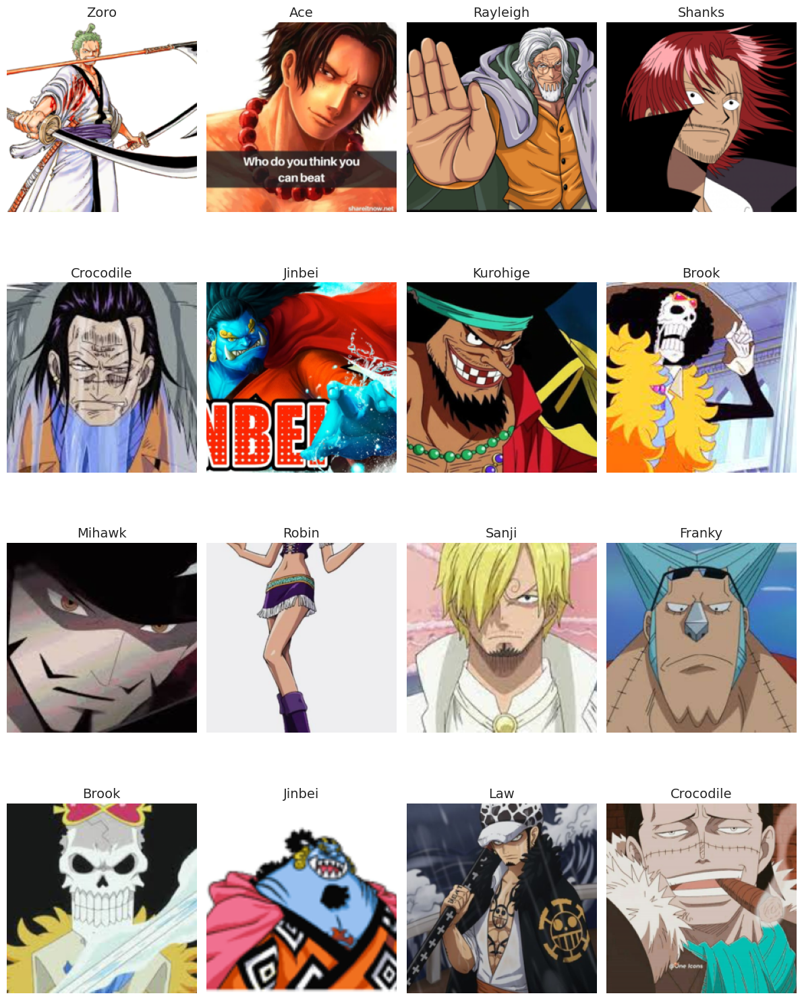

In [261]:
visualize_batch(test_classified_loader, idx_to_class, mean=dataset_ext_stats_232['mean'], std=dataset_ext_stats_232['std'])

---

#### model

In [262]:
resnet50_model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)

In [263]:
resnet50_model.fc = nn.Linear(in_features=resnet50_model.fc.in_features, 
                              out_features=NUM_CLASSES, bias=True)

trainable_params = [param for param in resnet50_model.parameters() if param.requires_grad]

In [264]:
summary(resnet50_model,
        input_size=(32, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 18]             --                   True
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   128                  True
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     4,096                True
│    │    └─BatchN

In [265]:
optimizer = Adam(trainable_params, lr=1e-3)

In [266]:
train_results['resnet_50'] = train_model(resnet50_model,
                                         train_loader_232,
                                         val_loader_232,
                                         15,
                                         loss_fn,
                                         optimizer,
                                         device)

Output()

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 0
Train Loss (CE): 2.0208 | Train F1 micro: 0.4479 | Train F1 macro: 0.3545 | Train F1 weighted: 0.4744 | Train Time:  59.25s
Valid Loss (CE): 1.5751 | Valid F1 micro: 0.6164 | Valid F1 macro: 0.5202 | Valid F1 weighted: 0.6087 | Valid Time:   4.69s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1
Train Loss (CE): 1.3900 | Train F1 micro: 0.6157 | Train F1 macro: 0.5302 | Train F1 weighted: 0.6311 | Train Time:  59.83s
Valid Loss (CE): 1.3806 | Valid F1 micro: 0.6459 | Valid F1 macro: 0.5524 | Valid F1 weighted: 0.6568 | Valid Time:   4.80s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2
Train Loss (CE): 1.1572 | Train F1 micro: 0.6818 | Train F1 macro: 0.6017 | Train F1 weighted: 0.6940 | Train Time:  60.76s
Valid Loss (CE): 1.1258 | Valid F1 micro: 0.6936 | Valid F1 macro: 0.6496 | Valid F1 weighted: 0.7140 | Valid Time:   4.83s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3
Train Loss (CE): 1.0249 | Train F1 micro: 0.7090 | Train F1 macro: 0.6419 | Train F1 weighted: 0.7187 | Train Time:  61.13s
Valid Loss (CE): 1.0677 | Valid F1 micro: 0.6836 | Valid F1 macro: 0.6253 | Valid F1 weighted: 0.7149 | Valid Time:   4.95s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4
Train Loss (CE): 0.9388 | Train F1 micro: 0.7254 | Train F1 macro: 0.6606 | Train F1 weighted: 0.7335 | Train Time:  62.10s
Valid Loss (CE): 1.0570 | Valid F1 micro: 0.6927 | Valid F1 macro: 0.6359 | Valid F1 weighted: 0.7132 | Valid Time:   4.94s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5
Train Loss (CE): 0.8743 | Train F1 micro: 0.7505 | Train F1 macro: 0.6830 | Train F1 weighted: 0.7582 | Train Time:  62.26s
Valid Loss (CE): 0.7884 | Valid F1 micro: 0.7662 | Valid F1 macro: 0.7089 | Valid F1 weighted: 0.7740 | Valid Time:   4.97s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6
Train Loss (CE): 0.7632 | Train F1 micro: 0.7679 | Train F1 macro: 0.7185 | Train F1 weighted: 0.7731 | Train Time:  62.11s
Valid Loss (CE): 0.8660 | Valid F1 micro: 0.7390 | Valid F1 macro: 0.6820 | Valid F1 weighted: 0.7532 | Valid Time:   4.91s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7
Train Loss (CE): 0.7304 | Train F1 micro: 0.7726 | Train F1 macro: 0.7221 | Train F1 weighted: 0.7779 | Train Time:  62.22s
Valid Loss (CE): 0.8641 | Valid F1 micro: 0.8062 | Valid F1 macro: 0.7663 | Valid F1 weighted: 0.8051 | Valid Time:   4.92s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8
Train Loss (CE): 0.7030 | Train F1 micro: 0.7835 | Train F1 macro: 0.7366 | Train F1 weighted: 0.7887 | Train Time:  62.18s
Valid Loss (CE): 0.7117 | Valid F1 micro: 0.7944 | Valid F1 macro: 0.7607 | Valid F1 weighted: 0.8037 | Valid Time:   4.82s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9
Train Loss (CE): 0.6523 | Train F1 micro: 0.8002 | Train F1 macro: 0.7526 | Train F1 weighted: 0.8040 | Train Time:  61.96s
Valid Loss (CE): 0.6400 | Valid F1 micro: 0.8062 | Valid F1 macro: 0.7600 | Valid F1 weighted: 0.8112 | Valid Time:   4.84s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 10
Train Loss (CE): 0.6705 | Train F1 micro: 0.7878 | Train F1 macro: 0.7420 | Train F1 weighted: 0.7924 | Train Time:  62.10s
Valid Loss (CE): 0.6137 | Valid F1 micro: 0.8320 | Valid F1 macro: 0.8015 | Valid F1 weighted: 0.8357 | Valid Time:   4.86s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 11
Train Loss (CE): 0.6081 | Train F1 micro: 0.8019 | Train F1 macro: 0.7558 | Train F1 weighted: 0.8062 | Train Time:  62.12s
Valid Loss (CE): 0.7016 | Valid F1 micro: 0.7417 | Valid F1 macro: 0.7163 | Valid F1 weighted: 0.7534 | Valid Time:   4.88s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 12
Train Loss (CE): 0.5445 | Train F1 micro: 0.8220 | Train F1 macro: 0.7861 | Train F1 weighted: 0.8252 | Train Time:  62.06s
Valid Loss (CE): 0.6009 | Valid F1 micro: 0.8361 | Valid F1 macro: 0.8069 | Valid F1 weighted: 0.8375 | Valid Time:   4.86s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 13
Train Loss (CE): 0.5299 | Train F1 micro: 0.8277 | Train F1 macro: 0.7922 | Train F1 weighted: 0.8309 | Train Time:  61.94s
Valid Loss (CE): 0.5768 | Valid F1 micro: 0.8216 | Valid F1 macro: 0.7887 | Valid F1 weighted: 0.8277 | Valid Time:   4.82s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Training:   0%|          | 0/322 [00:00<?, ?it/s]

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 14
Train Loss (CE): 0.5479 | Train F1 micro: 0.8273 | Train F1 macro: 0.7891 | Train F1 weighted: 0.8301 | Train Time:  61.92s
Valid Loss (CE): 0.6555 | Valid F1 micro: 0.7930 | Valid F1 macro: 0.7568 | Valid F1 weighted: 0.8039 | Valid Time:   4.85s
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


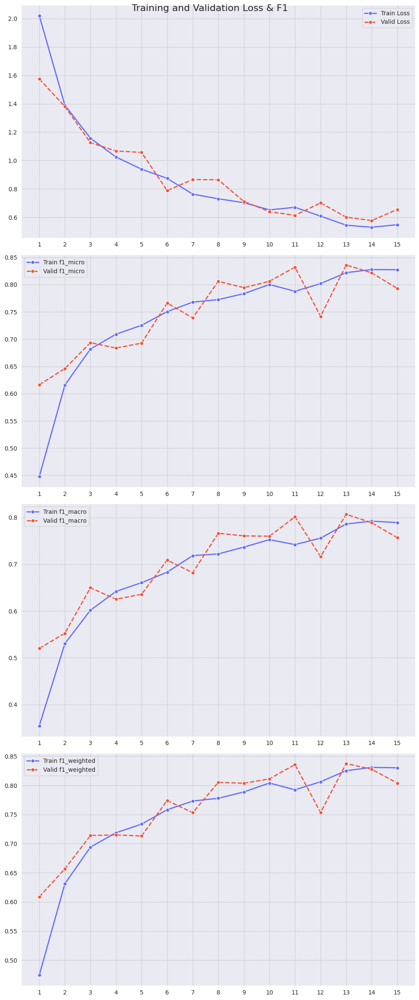

In [ ]:
plot_metrics(train_results['resnet_50'])

In [269]:
test_results['resnet_50'] = test_epoch(
    test_loader_232, resnet50_model, loss_fn, device, 
    metrics = MetricCollection({
        'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
        'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
        'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/69 [00:00<?, ?it/s]

In [270]:
print(f"Test loss: {test_results['resnet_50'][0]:4f} | ",
      f"F1 micro: {test_results['resnet_50'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {test_results['resnet_50'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {test_results['resnet_50'][1]['f1_weighted']:.3f}")

Test loss: 0.739756 |  F1 micro: 0.802 |  F1 macro: 0.755 |  F1 weighted: 0.813


In [271]:
true_test_results['resnet_50'] = test_epoch(
    test_classified_loader, resnet50_model, loss_fn, device, 
    metrics = MetricCollection({
          'f1_micro': MulticlassF1Score(num_classes=NUM_CLASSES, average='micro').to(device),
          'f1_macro': MulticlassF1Score(num_classes=NUM_CLASSES, average='macro').to(device),
          'f1_weighted': MulticlassF1Score(num_classes=NUM_CLASSES, average='weighted').to(device),
    })
)

Evaluation:   0%|          | 0/54 [00:00<?, ?it/s]

In [273]:
print(f"Test loss: {true_test_results['resnet_50'][0]:4f} | ",
      f"F1 micro: {true_test_results['resnet_50'][1]['f1_micro']:.3f} | ",
      f"F1 macro: {true_test_results['resnet_50'][1]['f1_macro']:.3f} | ",
      f"F1 weighted: {true_test_results['resnet_50'][1]['f1_weighted']:.3f}")

Test loss: 0.312789 |  F1 micro: 0.894 |  F1 macro: 0.894 |  F1 weighted: 0.896


In [274]:
clean_a_bit()

In [275]:
resnet50_model.cpu()
del resnet50_model

---

## Сравнение итоговых результатов

In [291]:
def display_model_comparison(results_dict):
    rows = []
    for model, (main_metric, f1_scores) in results_dict.items():
        row = {
            "Model": model,
            "CE_loss": main_metric,
            **f1_scores
        }
        rows.append(row)

    df = pd.DataFrame(rows)

    cols = ["Model", "CE_loss", "f1_macro", "f1_micro", "f1_weighted"]
    df = df[cols]

    styled_df = (
        df.style
        .background_gradient(
            subset=["CE_loss"], cmap="RdYlGn_r"   # lower is better
        )
        .background_gradient(
            subset=["f1_macro", "f1_micro", "f1_weighted"], cmap="RdYlGn"
        )
        .format({
            "CE_loss": "{:.4f}",
            "f1_macro": "{:.4f}",
            "f1_micro": "{:.4f}",
            "f1_weighted": "{:.4f}"
        })
        .set_caption("Model Performance Comparison")
    )

    return styled_df

In [292]:
display_model_comparison(test_results)

,Model,CE_loss,f1_macro,f1_micro,f1_weighted
0,efficient_net,0.9392,0.6687,0.7264,0.7308
1,beit,0.6239,0.7783,0.8285,0.8331
2,resnet_50,0.7398,0.7546,0.8022,0.8127


In [293]:
display_model_comparison(true_test_results)

,Model,CE_loss,f1_macro,f1_micro,f1_weighted
0,efficient_net,0.6540,0.7688,0.7750,0.7720
1,beit,0.2823,0.9146,0.9152,0.9152
2,resnet_50,0.3128,0.8937,0.8940,0.8962
